In [1]:
from pathlib import Path
import sys

_here = Path.cwd().resolve()
_candidates = (_here, *_here.parents)
REPO_ROOT = next((candidate for candidate in _candidates if (candidate / "m33_pipeline").is_dir()), None)
if REPO_ROOT is None:
    raise RuntimeError(f"Could not locate repo root from {Path.cwd()}")
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from m33_pipeline.notebook_setup import prepare_notebook

REPO_ROOT = prepare_notebook(REPO_ROOT)
print(f"Notebook working directory set to: {REPO_ROOT}")

Notebook working directory set to: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1


In [2]:
field = 'NW'
max_zoi = 100
flux_method = 'integrated_spectrum' #integrated_spectrum or summed_map
dig_mode = 'dig_subtracted' #dig_subtracted or no_dig


In [3]:
# Parameters
field = "F6"
flux_method = "summed_map"
dig_mode = "no_dig"


# 6: Build the field flux catalog, then compute extinction, BPT diagnostics, and plots

In [4]:
from dataclasses import replace
import importlib

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.io import fits
import os

from m33_pipeline import paths
from m33_pipeline.io import read_catalog, read_fits_data, read_fits_data_header
import m33_pipeline.config as config_mod
import m33_pipeline.photometry as photometry_mod
import m33_pipeline.validate as validate_mod

# Force notebook runs to pick up local code changes without requiring manual kernel restarts.
config_mod = importlib.reload(config_mod)
photometry_mod = importlib.reload(photometry_mod)
validate_mod = importlib.reload(validate_mod)

get_photometry_config = config_mod.get_photometry_config
build_field_flux_catalog = photometry_mod.build_field_flux_catalog
load_flux_maps = photometry_mod.load_flux_maps
load_integrated_flux_table = photometry_mod.load_integrated_flux_table
load_region_inputs = photometry_mod.load_region_inputs
write_field_flux_catalog = photometry_mod.write_field_flux_catalog
validate_field_flux_catalog = validate_mod.validate_field_flux_catalog

print("Loaded photometry module from:", photometry_mod.__file__)
print("Active photometry config:", get_photometry_config())


Loaded photometry module from: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/m33_pipeline/photometry.py
Active photometry config: PhotometryConfig(max_zoi_pc=100, edge_ring_iterations=1, clip_negative_after_bg=False, dig_clip_sigma=3.0, dig_clip_iterations=2, dig_background_percentile=2.0, dig_line_ratio_to_halpha={'Halpha': 1.0, 'Hbeta': 0.3225806451612903, '[OIII]4959': 0.03, '[OIII]5007': 0.09, '[NII]6548': 0.07, '[NII]6583': 0.21, '[SII]6716': 0.12, '[SII]6731': 0.09, '[OII]3727': 0.25})


In [5]:
photometry_config = replace(get_photometry_config(), max_zoi_pc=max_zoi)
print("Using photometry_config:", photometry_config)
merged_df = build_field_flux_catalog(field, max_zoi, photometry_config, method=flux_method, dig_mode=dig_mode)

validation_warnings = validate_field_flux_catalog(merged_df, field)
if validation_warnings:
    print("Validation warnings:")
    for warning in validation_warnings:
        print(f"- {warning}")

# Compatibility variables for downstream notebook cells that still expect the old inline setup.
flux_maps = load_flux_maps(field)
ha_flux_data, ha_flux_err_data = flux_maps["Halpha"]
hb_flux_data, hb_flux_err_data = flux_maps["Hbeta"]
oiii_flux_data, oiii_flux_err_data = flux_maps["[OIII]5007"]
sii6716_flux_data, sii6716_flux_err_data = flux_maps["[SII]6716"]
sii6731_flux_data, sii6731_flux_err_data = flux_maps["[SII]6731"]
nii6584_flux_data, nii6584_flux_err_data = flux_maps["[NII]6583"]
oii3727_flux_data, oii3727_flux_err_data = flux_maps["[OII]3727"]

ha_flux_data, ha_flux_header = read_fits_data_header(paths.calibrated_field_map_dir(field) / f"M33{field}-Haflux.fits")
region_inputs = load_region_inputs(field, max_zoi)
peaks_df = region_inputs["peaks_df"]
zoi_map = region_inputs["zoi_map"]
boundary_map = region_inputs["boundary_map"]
boundary_metric_df = region_inputs["boundary_metrics_df"]
int_flux_df = load_integrated_flux_table(field, len(peaks_df))

print("Built field flux catalog:", merged_df.shape, "method=", flux_method, "dig_mode=", dig_mode)
merged_df.head()


Using photometry_config: PhotometryConfig(max_zoi_pc=100, edge_ring_iterations=1, clip_negative_after_bg=False, dig_clip_sigma=3.0, dig_clip_iterations=2, dig_background_percentile=2.0, dig_line_ratio_to_halpha={'Halpha': 1.0, 'Hbeta': 0.3225806451612903, '[OIII]4959': 0.03, '[OIII]5007': 0.09, '[NII]6548': 0.07, '[NII]6583': 0.21, '[SII]6716': 0.12, '[SII]6731': 0.09, '[OII]3727': 0.25})


Built field flux catalog: (370, 187) method= summed_map dig_mode= no_dig


,region_id,npix_region,npix_dig_annulus,dig_halpha_anchor,dig_halpha_source,F_Halpha_sum_nodig,F_Halpha_e_sum_nodig,SNR_Halpha_sum_nodig,Halpha_dig_median,Halpha_dig_mad,...,F_[NII]6583_peak,F_[NII]6583_e_peak,SNR_[NII]6583_peak,F_[OII]3727_peak_nodig,F_[OII]3727_e_peak_nodig,F_[OII]3727_peak_digsub,F_[OII]3727_e_peak_digsub,F_[OII]3727_peak,F_[OII]3727_e_peak,SNR_[OII]3727_peak
0,1,360,3143,2.391081e-18,boundary_bg_local,4.432302e-15,9.729603e-17,45.554810,2.391081e-18,NaN,...,5.397424e-18,3.397507e-18,1.588642,2.395563e-17,4.685283e-18,2.335786e-17,4.685283e-18,2.395563e-17,4.685283e-18,5.112953
1,2,1171,7259,2.994483e-18,boundary_bg_local,8.596814e-15,1.623038e-16,52.967418,2.994483e-18,NaN,...,1.505647e-18,2.595781e-18,0.580036,1.899320e-17,4.155908e-18,1.824458e-17,4.155908e-18,1.899320e-17,4.155908e-18,4.570169
2,3,985,3079,2.531050e-18,boundary_bg_local,1.016056e-14,1.559459e-16,65.154375,2.531050e-18,NaN,...,3.044305e-18,3.368518e-18,0.903752,1.135414e-17,4.351688e-18,1.072138e-17,4.351688e-18,1.135414e-17,4.351688e-18,2.609135
3,4,228,3082,7.817541e-18,boundary_bg_local,3.157391e-15,9.724354e-17,32.468896,7.817541e-18,NaN,...,6.017109e-19,4.764463e-18,0.126291,2.408990e-17,4.733812e-18,2.213552e-17,4.733812e-18,2.408990e-17,4.733812e-18,5.088902
4,5,475,2946,1.516597e-18,boundary_bg_local,4.844461e-15,1.081670e-16,44.786880,1.516597e-18,NaN,...,-2.937103e-20,2.724080e-18,-0.010782,2.284839e-17,4.079082e-18,2.246924e-17,4.079082e-18,2.284839e-17,4.079082e-18,5.601355


In [6]:
print("Regions with npix_region == 0:", (merged_df["npix_region"] == 0).sum())

for line_name in ["Halpha", "Hbeta", "[OIII]5007", "[SII]6716", "[SII]6731", "[NII]6583", "[OII]3727"]:
    n_nan = merged_df[f"{line_name}_dig_median"].isna().sum()
    print(f"{line_name}: NaN DIG medians = {n_nan}")

for col in merged_df.columns:
    print(col)


Regions with npix_region == 0: 0
Halpha: NaN DIG medians = 0
Hbeta: NaN DIG medians = 0
[OIII]5007: NaN DIG medians = 0
[SII]6716: NaN DIG medians = 0
[SII]6731: NaN DIG medians = 0
[NII]6583: NaN DIG medians = 0
[OII]3727: NaN DIG medians = 0
region_id
npix_region
npix_dig_annulus
dig_halpha_anchor
dig_halpha_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
F_Halpha_sum_digsub
F_Halpha_e_sum_digsub
SNR_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
F_Hbeta_sum_digsub
F_Hbeta_e_sum_digsub
SNR_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_mad
[OIII]5007_dig_clip_upper
[OIII]5007_dig_npix
[OIII]5007_dig_npix_used
F_[OIII]5007_sum_digsub
F_[OIII]5007_e_sum_digsub
SNR_[OIII]5007_sum_digs

In [7]:
# DIG diagnostics for the already-built catalog.
# `F_*_sum` are the active columns used downstream and already reflect `dig_mode`.
for line_name in ["Halpha", "Hbeta", "[OIII]5007", "[NII]6583", "[SII]6716", "[SII]6731", "[OII]3727"]:
    nodig_col = f"F_{line_name}_sum_nodig"
    digsub_col = f"F_{line_name}_sum_digsub"
    if nodig_col in merged_df.columns and digsub_col in merged_df.columns:
        delta = merged_df[nodig_col] - merged_df[digsub_col]
        print(
            f"{line_name}: median DIG subtraction = {np.nanmedian(delta):.3e}, "
            f"mean |DIG subtraction| = {np.nanmean(np.abs(delta)):.3e}"
        )
print("Active flux columns are using dig_mode =", dig_mode)

Halpha: median DIG subtraction = 2.800e-15, mean |DIG subtraction| = 5.101e-15
Hbeta: median DIG subtraction = 9.033e-16, mean |DIG subtraction| = 1.645e-15
[OIII]5007: median DIG subtraction = 2.520e-16, mean |DIG subtraction| = 4.590e-16
[NII]6583: median DIG subtraction = 5.679e-16, mean |DIG subtraction| = 1.057e-15
[SII]6716: median DIG subtraction = 3.202e-16, mean |DIG subtraction| = 6.001e-16
[SII]6731: median DIG subtraction = 2.402e-16, mean |DIG subtraction| = 4.481e-16
[OII]3727: median DIG subtraction = 7.001e-16, mean |DIG subtraction| = 1.275e-15
Active flux columns are using dig_mode = no_dig


In [8]:
if "DIG_fraction" in merged_df.columns:
    print("DIG fraction median:", np.nanmedian(merged_df["DIG_fraction"]))
    print("DIG fraction 90th percentile:", np.nanpercentile(merged_df["DIG_fraction"], 90))

DIG fraction median: 0.5222996295178517
DIG fraction 90th percentile: 1.0676520068182858


In [9]:
merged_df.head()

,region_id,npix_region,npix_dig_annulus,dig_halpha_anchor,dig_halpha_source,F_Halpha_sum_nodig,F_Halpha_e_sum_nodig,SNR_Halpha_sum_nodig,Halpha_dig_median,Halpha_dig_mad,...,F_[NII]6583_peak,F_[NII]6583_e_peak,SNR_[NII]6583_peak,F_[OII]3727_peak_nodig,F_[OII]3727_e_peak_nodig,F_[OII]3727_peak_digsub,F_[OII]3727_e_peak_digsub,F_[OII]3727_peak,F_[OII]3727_e_peak,SNR_[OII]3727_peak
0,1,360,3143,2.391081e-18,boundary_bg_local,4.432302e-15,9.729603e-17,45.554810,2.391081e-18,NaN,...,5.397424e-18,3.397507e-18,1.588642,2.395563e-17,4.685283e-18,2.335786e-17,4.685283e-18,2.395563e-17,4.685283e-18,5.112953
1,2,1171,7259,2.994483e-18,boundary_bg_local,8.596814e-15,1.623038e-16,52.967418,2.994483e-18,NaN,...,1.505647e-18,2.595781e-18,0.580036,1.899320e-17,4.155908e-18,1.824458e-17,4.155908e-18,1.899320e-17,4.155908e-18,4.570169
2,3,985,3079,2.531050e-18,boundary_bg_local,1.016056e-14,1.559459e-16,65.154375,2.531050e-18,NaN,...,3.044305e-18,3.368518e-18,0.903752,1.135414e-17,4.351688e-18,1.072138e-17,4.351688e-18,1.135414e-17,4.351688e-18,2.609135
3,4,228,3082,7.817541e-18,boundary_bg_local,3.157391e-15,9.724354e-17,32.468896,7.817541e-18,NaN,...,6.017109e-19,4.764463e-18,0.126291,2.408990e-17,4.733812e-18,2.213552e-17,4.733812e-18,2.408990e-17,4.733812e-18,5.088902
4,5,475,2946,1.516597e-18,boundary_bg_local,4.844461e-15,1.081670e-16,44.786880,1.516597e-18,NaN,...,-2.937103e-20,2.724080e-18,-0.010782,2.284839e-17,4.079082e-18,2.246924e-17,4.079082e-18,2.284839e-17,4.079082e-18,5.601355


In [10]:
print("Active notebook configuration:")
print(" field      =", field)
print(" flux_method=", flux_method)
print(" dig_mode   =", dig_mode)

Active notebook configuration:
 field      = F6
 flux_method= summed_map
 dig_mode   = no_dig


In [11]:
# Extinction (E(B-V), A_V) + dereddening for the active flux columns, plus RA/Dec, R_gal, and BPT classes

import numpy as np
import pandas as pd

from astropy.wcs import WCS
from astropy.coordinates import SkyCoord, SkyOffsetFrame
import astropy.units as u

INTRINSIC_HA_HB = 2.86
R_V = 3.1

# M33 geometry (EDIT if you use different values)
M33_CENTER = SkyCoord("01h33m50.9s", "+30d39m36.8s", frame="icrs")
M33_INCL = np.deg2rad(56.0)   # radians
M33_PA   = np.deg2rad(23.0)   # radians (E of N)
M33_D_KPC = 840.0             # distance in kpc

ASSUME_1_BASED_PIXELS = False 

# Integrated error column suffix
ERR_SUFFIX = "_e"

# Lines and wavelengths (Angstrom)
LINE_WAVES = {
    "Hbeta":       4861.0,
    "[OIII]5007": 5007.0,
    "Halpha":       6563.0,
    "[NII]6583":  6584.0,
    "[SII]6716":  6716.0,
    "[SII]6731":  6731.0,
    "[OII]3727":  3727.0,
}


# CCM89 extinction curve: k(lambda) = A(lambda) / E(B-V)
def ccm89_k_lambda(wave_angstrom, R_V=3.1):
    wave_micron = wave_angstrom * 1e-4  # Å -> μm
    x = 1.0 / wave_micron               # inverse microns

    # Optical/NIR: 1.1 <= x <= 3.3
    y = x - 1.82
    a = (1
         + 0.17699 * y
         - 0.50447 * y**2
         - 0.02427 * y**3
         + 0.72085 * y**4
         + 0.01979 * y**5
         - 0.77530 * y**6
         + 0.32999 * y**7)
    b = (1.41338 * y
         + 2.28305 * y**2
         + 1.07233 * y**3
         - 5.38434 * y**4
         - 0.62251 * y**5
         + 5.30260 * y**6
         - 2.09002 * y**7)
    return a * R_V + b

k_Ha = ccm89_k_lambda(6563.0, R_V=R_V)
k_Hb = ccm89_k_lambda(4861.0, R_V=R_V)
delta_k = k_Hb - k_Ha
ln10 = np.log(10.0)

# compute EBV/AV + deredden for a given flux suffix
def add_extinction_and_deredden(df, flux_suffix, prefix):
    """
    Computes E(B-V), A_V from Ha/Hb using:
      Ha = df[f"Halpha{flux_suffix}"], Hb = df[f"Hbeta{flux_suffix}"]
    Uses integrated uncertainties:
      eHa = df[f"Halpha{ERR_SUFFIX}"], eHb = df[f"Hbeta{ERR_SUFFIX}"]

    Outputs (examples for prefix='raw'):
      raw_Ha_Hb_obs, raw_E_BV, raw_A_V, raw_Halpha_F_dered, raw_Halpha_sigma_F_dered, ...
      raw_log_NII_Ha, raw_log_OIII_Hb, raw_BPT_class
    """
    # --- Balmer decrement ---
    Ha  = df[f"F_Halpha{flux_suffix}"].to_numpy(dtype=float)
    Hb  = df[f"F_Hbeta{flux_suffix}"].to_numpy(dtype=float)
    eHa = df[f"F_Halpha{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)
    eHb = df[f"F_Hbeta{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)

    good = np.isfinite(Ha) & np.isfinite(Hb) & np.isfinite(eHa) & np.isfinite(eHb) & (Ha > 0) & (Hb > 0) & (eHa >= 0) & (eHb >= 0)

    ratio = np.full(len(df), np.nan, dtype=float)
    ratio_err = np.full(len(df), np.nan, dtype=float)

    ratio[good] = Ha[good] / Hb[good]
    ratio_err[good] = ratio[good] * np.sqrt((eHa[good]/Ha[good])**2 + (eHb[good]/Hb[good])**2)

    with np.errstate(divide="ignore", invalid="ignore"):
        ebv = (2.5 / delta_k) * np.log10(ratio / INTRINSIC_HA_HB)

    # Clip negative extinction to 0 (common practical choice)
    ebv = np.where(np.isfinite(ebv), ebv, np.nan)
    ebv = np.clip(ebv, 0, None)

    # Uncertainty propagation: dE/dR = (2.5/delta_k)/(ln10 * R)
    A = (2.5 / delta_k)
    with np.errstate(divide="ignore", invalid="ignore"):
        dE_dR = A / (ln10 * ratio)
        ebv_err = np.abs(dE_dR) * ratio_err

    Av = R_V * ebv
    Av_err = R_V * ebv_err

    df[f"{prefix}_Ha_Hb_obs"] = ratio
    df[f"{prefix}_Ha_Hb_obs_err"] = ratio_err
    df[f"{prefix}_E_BV"] = ebv
    df[f"{prefix}_E_BV_err"] = ebv_err
    df[f"{prefix}_A_V"] = Av
    df[f"{prefix}_A_V_err"] = Av_err

    # Deredden all lines
    E = ebv
    eE = ebv_err

    for line, wave in LINE_WAVES.items():
        
        Fcol = f"F_{line}{flux_suffix}"
        ecol = f"F_{line}{ERR_SUFFIX}{flux_suffix}"
        if (Fcol not in df.columns) or (ecol not in df.columns):
            continue

        F = df[Fcol].to_numpy(dtype=float)
        eF = df[ecol].to_numpy(dtype=float)

        k = ccm89_k_lambda(wave, R_V=R_V)
        C = 10.0 ** (0.4 * E * k)
        F_dered = F * C

        # sigma(F_dered)^2 = (C*sigma_F)^2 + (F * dC/dE * sigma_E)^2
        dC_dE = C * (0.4 * ln10 * k)
        eF_dered = np.sqrt((C * eF)**2 + (F * dC_dE * eE)**2)

        df[f"F_{line}_{prefix}_dered"] = F_dered
        df[f"F_{line}_e_{prefix}_dered"] = eF_dered

    # BPT classification using DEREDDENED fluxes for this prefix
    nii  = df.get(f"F_[NII]6583_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    nii_err = df.get(f"F_[NII]6583_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0  = df.get(f"F_Halpha_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0_err = df.get(f"F_Halpha_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii = df.get(f"F_[OIII]5007_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii_err = df.get(f"F_[OIII]5007_e_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb0  = df.get(f"F_Hbeta_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb_err = df.get(f"F_Hbeta_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii = df.get(f"F_[SII]6716_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float) + \
          df.get(f"F_[SII]6731_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii_err = np.sqrt(df.get(f"F_[SII]6716_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2 +
                      df.get(f"F_[SII]6731_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2)
    good_bpt = np.isfinite(nii) & np.isfinite(ha0) & np.isfinite(oiii) & np.isfinite(hb0) & (nii > 0) & (ha0 > 0) & (oiii > 0) & (hb0 > 0)
    print(f"{prefix}: {np.sum(good_bpt)} valid points for BPT classification")
    
    log_NII_Ha = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha[good_bpt] = np.log10(nii[good_bpt] / ha0[good_bpt])
    log_OIII_Hb[good_bpt] = np.log10(oiii[good_bpt] / hb0[good_bpt])
    log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])
    
    #also add error in ratios for plotting
    log_NII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb_err = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha_err[good_bpt] = np.sqrt((nii_err[good_bpt] / nii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)
    log_OIII_Hb_err[good_bpt] = np.sqrt((oiii_err[good_bpt] / oiii[good_bpt])**2 + (hb_err[good_bpt] / hb0[good_bpt])**2) / np.log(10)
    log_SII_Ha_err[good_bpt] = np.sqrt((sii_err[good_bpt] / sii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)

    xB = log_NII_Ha
    yB = log_OIII_Hb

    kewley_y = 0.61 / (xB - 0.47) + 1.19
    kauff_y  = 0.61 / (xB - 0.05) + 1.30

    bpt_class = np.full(len(df), "Unclassified", dtype=object)
    finite = np.isfinite(xB) & np.isfinite(yB)
    bpt_class[finite & (yB < kauff_y)] = "Star-forming"
    bpt_class[finite & (yB >= kauff_y) & (yB < kewley_y)] = "Composite"
    bpt_class[finite & (yB >= kewley_y)] = "AGN/Shock"

    df[f"log_NII_Ha_{prefix}_dered"] = log_NII_Ha
    df[f"log_NII_Ha_err_{prefix}_dered"] = log_NII_Ha_err
    df[f"log_OIII_Hb_{prefix}_dered"] = log_OIII_Hb
    df[f"log_OIII_Hb_err_{prefix}_dered"] = log_OIII_Hb_err
    df[f"log_SII_Ha_{prefix}_dered"] = log_SII_Ha
    df[f"log_SII_Ha_err_{prefix}_dered"] = log_SII_Ha_err
    df[f"BPT_class_{prefix}_dered"] = bpt_class

    return df

#  Run on the active flux columns
df = merged_df  # work on your merged catalog
df = add_extinction_and_deredden(df, flux_suffix="_sum",   prefix="sum")
# df = add_extinction_and_deredden(df, flux_suffix="_int", prefix="int")

# Add RA/Dec from WCS using peaks_df x,y (row-aligned)
w = WCS(ha_flux_header)

x = peaks_df["x"].to_numpy(dtype=float)
y = peaks_df["y"].to_numpy(dtype=float)
if ASSUME_1_BASED_PIXELS:
    x = x - 1.0
    y = y - 1.0

ra_deg, dec_deg = w.pixel_to_world_values(x, y)

print(len(df), "rows in catalog")
print(len(ra_deg), "RA values, with range", np.nanmin(ra_deg), "to", np.nanmax(ra_deg))
df["RA_deg"] = ra_deg
df["Dec_deg"] = dec_deg

# Galactocentric radius (deprojected) in kpc
coords = SkyCoord(ra=df["RA_deg"].to_numpy() * u.deg,
                  dec=df["Dec_deg"].to_numpy() * u.deg,
                  frame="icrs")

offset_frame = SkyOffsetFrame(origin=M33_CENTER)
off = coords.transform_to(offset_frame)

x_east_kpc  = off.lon.to(u.radian).value * M33_D_KPC
y_north_kpc = off.lat.to(u.radian).value * M33_D_KPC

sinPA, cosPA = np.sin(M33_PA), np.cos(M33_PA)
x_major = x_east_kpc * sinPA + y_north_kpc * cosPA
y_minor = x_east_kpc * cosPA - y_north_kpc * sinPA

y_minor_deproj = y_minor / np.cos(M33_INCL)
df["R_gal_kpc"] = np.sqrt(x_major**2 + y_minor_deproj**2)

# Write back
merged_df = df

#print all the new column names:
for col in merged_df.columns:
    print(col)

sum: 333 valid points for BPT classification
370 rows in catalog
370 RA values, with range 23.230076709842 to 23.427625323816603
region_id
npix_region
npix_dig_annulus
dig_halpha_anchor
dig_halpha_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
F_Halpha_sum_digsub
F_Halpha_e_sum_digsub
SNR_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
F_Hbeta_sum_digsub
F_Hbeta_e_sum_digsub
SNR_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_mad
[OIII]5007_dig_clip_upper
[OIII]5007_dig_npix
[OIII]5007_dig_npix_used
F_[OIII]5007_sum_digsub
F_[OIII]5007_e_sum_digsub
SNR_[OIII]5007_sum_digsub
F_[SII]6716_sum_nodig
F_[SII]6716_e_sum_nodig
SNR_[SII]6716_sum_nodig
[SII]6716_dig_median
[SII]6716_dig_mad
[SI

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_84371/2267366169.py:160: RuntimeWarning: invalid value encountered in log10
  log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])


In [12]:
DIST_MPC = 0.84  # M33 distance in Mpc

# Flux -> luminosity conversion
# L = 4*pi*D^2*F, with D in cm if F is erg/s/cm^2
PC_CM = 3.085677581e18
D_cm = DIST_MPC * 1e6 * PC_CM
four_pi_D2 = 4.0 * np.pi * (D_cm**2)

# Halpha flux columns already present in the active catalog
# These are the fluxes selected by `flux_method` and `dig_mode`.
F_ha_raw   = merged_df["F_Halpha_sum"].to_numpy(dtype=float)
# F_ha_int = merged_df["F_Halpha_int"].to_numpy(dtype=float)

# dereddened (created by the earlier cell):
F_ha_raw_dered   = merged_df["F_Halpha_sum_dered"].to_numpy(dtype=float)
# F_ha_int_dered = merged_df["F_Halpha_int_dered"].to_numpy(dtype=float)

# Add luminosity columns (erg/s if flux is erg/s/cm^2)
merged_df["L_Ha_sum"] = four_pi_D2 * F_ha_raw
# merged_df["L_Ha_int"] = four_pi_D2 * F_ha_int
merged_df["L_Ha_sum_dered"] = four_pi_D2 * F_ha_raw_dered
# merged_df["L_Ha_int_dered"] = four_pi_D2 * F_ha_int_dered

#add a column for log luminosity as well:
merged_df["log_L_Ha_sum"] = np.log10(merged_df["L_Ha_sum"])
# merged_df["log_L_Ha_int"] = np.log10(merged_df["L_Ha_int"])
merged_df["log_L_Ha_sum_dered"] = np.log10(merged_df["L_Ha_sum_dered"])
# merged_df["log_L_Ha_int_dered"] = np.log10(merged_df["L_Ha_int_dered"])

print("Added:", ["L_Ha_sum", "L_Ha_sum_dered"])

Added: ['L_Ha_sum', 'L_Ha_sum_dered']


/Users/emmajarvis/miniconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [13]:
outfile = write_field_flux_catalog(field, merged_df, method=flux_method, dig_mode=dig_mode)

print("Saved:", outfile)
print("Method:", flux_method)
print("DIG mode:", dig_mode)
print("Rows:", len(merged_df), "Cols:", len(merged_df.columns))


Saved: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/CATALOGS/flux_catalogs/summed_map/no_dig/flux_catalog_F6.csv
Method: summed_map
DIG mode: no_dig
Rows: 370 Cols: 221


In [14]:
# make field-specific folders so each notebook variant writes distinct outputs
figure_dir = os.path.join("plots", "individual_field_flux_plots", field)
bpt_dir = os.path.join(figure_dir, "bpt")
os.makedirs(bpt_dir, exist_ok=True)

Saved: plots/individual_field_flux_plots/F6/bpt/BPT_F6_summed_map_no_dig_sum.png


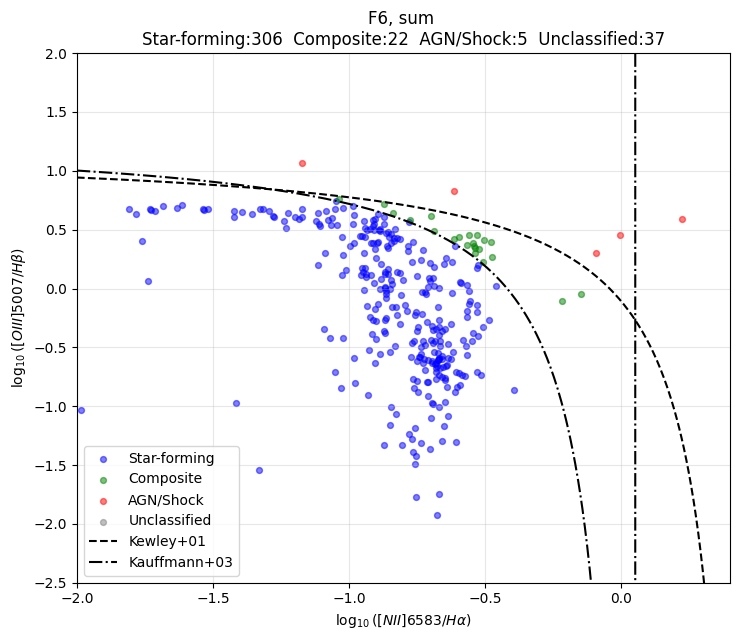

In [15]:
# Compute BPT points

prefix = "sum"
x_raw, y_raw = merged_df[f'log_NII_Ha_{prefix}_dered'].to_numpy(dtype=float), merged_df[f'log_OIII_Hb_{prefix}_dered'].to_numpy(dtype=float)
# x_bg,  y_bg  = bpt_xy(merged_df, use_bgsub=True)

# Demarcation curves (classic BPT)
x_curve = np.linspace(-2.0, 0.6, 600)
kewley = 0.61 / (x_curve - 0.47) + 1.19      # Kewley+2001
kauff  = 0.61 / (x_curve - 0.05) + 1.30      # Kauffmann+2003

# ---- Plot: overlay raw vs corrected in one figure ----
plt.figure(figsize=(7.5, 6.5))

classes = ["Star-forming", "Composite", "AGN/Shock", "Unclassified"]
colors = ['blue', 'green', 'red', 'grey']
for cls in classes:
    mask = (merged_df[f'BPT_class_{prefix}_dered'] == cls)
    plt.scatter(x_raw[mask], y_raw[mask], s=18, alpha=0.5, label=cls, color=colors[classes.index(cls)])
# #color by BPT class
# plt.scatter(x_raw[merged_df['raw_BPT_class'] == 'star-forming'], 
#             y_raw[merged_df['raw_BPT_class'] == 'star-forming'], s=18, alpha=0.5, label="Star-forming")
# # plt.scatter(x_bg,  y_bg,  s=18, alpha=0.5, label="Background-subtracted (edge threshold)")

plt.plot(x_curve, kewley, linestyle="--", label="Kewley+01", color = 'k')
plt.plot(x_curve, kauff,  linestyle="-.", label="Kauffmann+03", color = 'k')

plt.xlabel(r'$\log_{10}([NII]6583 / H\alpha)$')
plt.ylabel(r'$\log_{10}([OIII]5007 / H\beta)$')
plt.title(f"{field}, {prefix} \nStar-forming:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Star-forming'])}  Composite:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Composite'])}  AGN/Shock:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'AGN/Shock'])}  Unclassified:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Unclassified'])}")

plt.xlim(-2, 0.4)
plt.ylim(-2.5, 2)
plt.grid(alpha=0.3)
plt.legend(frameon=True)
plt.tight_layout()
bpt_filename = f"BPT_{field}_{flux_method}_{dig_mode}_{prefix}.png"
plt.savefig(os.path.join(bpt_dir, bpt_filename), dpi=150)
print("Saved:", os.path.join(bpt_dir, bpt_filename))
plt.show()

In [16]:
def plot_field_overlay_halpha_peaks_zoi_boundaries(
    catalog_df,
    ha_fits_path,
    zoi_label_map,
    boundary_label_map,
    field_name=None,
    x_col="x",
    y_col="y",
    region_label_col="zoi_center_label",
    region_id_col="region_id",
    xlim=None,
    ylim=None,
    show_peaks=True,
    show_zoi=True,
    show_boundaries=True,
    peaks_kwargs=None,
    zoi_color="cyan",
    boundary_color="magenta",
    zoi_lw=0.8,
    boundary_lw=1.1,
    alpha_zoi=0.65,
    alpha_boundary=0.9,
    # NEW: LogNorm controls
    ha_percentiles=(5, 99),         # global vmin/vmax percentiles (positive pixels only)
    use_local_lognorm=False,        # if True and xlim/ylim provided -> compute per-view norm
    local_percentiles=(3.0, 99.7),  # per-view percentiles (positive pixels only)
    min_pos_pixels=20,              # minimum positive pixels required to trust local percentiles
    eps_pos=None,                   # epsilon floor for vmin (defaults to nextafter(0,1))
    savepath=None,
    line = 'Halpha'
):
    """
    Overplot peaks + ZOI outlines + boundary outlines on the Halpha map, using LogNorm scaling.

    Parameters
    ----------
    catalog_df : pandas.DataFrame
        Must include x_col/y_col; should include region_label_col (integer ZOI label at center).
    ha_fits_path : str
        Path to Halpha FITS.
    zoi_label_map : 2D array
        Integer-labeled ZOI map (0 outside).
    boundary_label_map : 2D array
        Integer-labeled boundary map (0 outside).
    field_name : str
        Optional display name.
    xlim, ylim : (min,max) or None
        Plot limits in pixel coordinates.
    ha_percentiles : (lo, hi)
        Percentiles used for global LogNorm vmin/vmax (positive finite pixels only).
    use_local_lognorm : bool
        If True and xlim/ylim are given, compute per-view LogNorm using local_percentiles,
        falling back to global if too few positive pixels.
    """

    import numpy as np
    import matplotlib.pyplot as plt
    from astropy.io import fits
    from matplotlib.colors import LogNorm

    # Lazy import so this cell works even if skimage isn't installed elsewhere
    try:
        from skimage.segmentation import find_boundaries  # noqa: F401  (kept as in your original)
    except Exception as e:
        raise ImportError(
            "This plotting function requires scikit-image. "
            "Install with: pip install scikit-image"
        ) from e

    if eps_pos is None:
        eps_pos = np.nextafter(0, 1)

    # --- Field name ---
    if field_name is None:
        field_name = (
            str(catalog_df.get("field", ["Field"]).iloc[0])
            if hasattr(catalog_df, "iloc")
            else "Field"
        )

    # --- Load Halpha map ---
    ha = fits.getdata(ha_fits_path)
    ha = np.where(np.isfinite(ha), ha, np.nan)

    # --- Compute GLOBAL LogNorm vmin/vmax from positive finite pixels ---
    valid_pos = ha[np.isfinite(ha) & (ha > 0)]
    if valid_pos.size == 0:
        raise ValueError("Hα map has no positive finite values for LogNorm.")

    vmin_global = np.nanpercentile(valid_pos, ha_percentiles[0])
    vmax_global = np.nanpercentile(valid_pos, ha_percentiles[1])

    # Fallback if percentiles are degenerate
    if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
        vmin_global, vmax_global = np.nanmin(valid_pos), np.nanmax(valid_pos)
        if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
            raise ValueError("Failed to compute valid global vmin/vmax for Hα.")

    vmin_global = max(vmin_global, eps_pos)

    def _local_lognorm(arr2d):
        """Compute a per-view LogNorm using positive finite pixels, fallback to global."""
        pos = arr2d[np.isfinite(arr2d) & (arr2d > 0)]
        vmin_loc, vmax_loc = vmin_global, vmax_global

        if pos.size >= min_pos_pixels:
            lo = np.nanpercentile(pos, local_percentiles[0])
            hi = np.nanpercentile(pos, local_percentiles[1])
            if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                vmin_loc, vmax_loc = lo, hi

        vmin_loc = max(vmin_loc, eps_pos)
        if (not np.isfinite(vmax_loc)) or (vmax_loc <= vmin_loc):
            vmax_loc = vmin_loc * 1.01
        return LogNorm(vmin=vmin_loc, vmax=vmax_loc)

    # Decide norm: global or local-per-view
    norm = LogNorm(vmin=vmin_global, vmax=vmax_global)
    if use_local_lognorm and (xlim is not None) and (ylim is not None):
        # Clip indices safely and compute norm on that view
        x0, x1 = sorted([int(np.floor(xlim[0])), int(np.ceil(xlim[1]))])
        y0, y1 = sorted([int(np.floor(ylim[0])), int(np.ceil(ylim[1]))])
        x0 = max(0, x0); y0 = max(0, y0)
        x1 = min(ha.shape[1], x1); y1 = min(ha.shape[0], y1)
        view = ha[y0:y1, x0:x1]
        if view.size > 0:
            norm = _local_lognorm(view)

    # --- Ensure integer maps ---
    zoi_int = np.rint(np.nan_to_num(zoi_label_map, nan=0)).astype(np.int32)
    bnd_int = np.rint(np.nan_to_num(boundary_label_map, nan=0)).astype(np.int32)

    # --- Figure ---
    fig, ax = plt.subplots(figsize=(10, 10 * ha.shape[0] / ha.shape[1]))

    # Make NaNs white
    cmap_gray = plt.get_cmap("gray").copy()
    cmap_gray.set_bad(color="white")

    # IMPORTANT CHANGE: show ha (linear) with LogNorm (not log10(ha))
    im = ax.imshow(ha, origin="lower", cmap=cmap_gray, norm=norm)

    # --- Overlay outlines ---
    labels_from_catalog = None
    if hasattr(catalog_df, "columns") and (region_label_col in catalog_df.columns):
        labels_from_catalog = sorted({
            int(v) for v in catalog_df[region_label_col].values
            if np.isfinite(v) and int(v) > 0
        })

    if labels_from_catalog and len(labels_from_catalog) > 0:
        labels = labels_from_catalog
    else:
        labels = sorted([int(v) for v in np.unique(bnd_int) if v > 0])

    # NOTE: your original code contours the entire label maps at 0.5, which is fine.
    if show_zoi and np.isfinite(zoi_int).any():
        edge = np.nan_to_num(zoi_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[zoi_color], linewidths=zoi_lw,
                   origin="lower", zorder=1, alpha=alpha_zoi)
    if show_boundaries and np.isfinite(bnd_int).any():
        edge = np.nan_to_num(bnd_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[boundary_color], linewidths=boundary_lw,
                   origin="lower", zorder=1, alpha=alpha_boundary)

    # --- Plot peak centers ---
    if show_peaks:
        if peaks_kwargs is None:
            peaks_kwargs = dict(marker="+", s=18, linewidths=0.8, alpha=0.85)
        xs = catalog_df[x_col].astype(float).values
        ys = catalog_df[y_col].astype(float).values
        ax.scatter(xs, ys, color="k", **peaks_kwargs, label="Peaks")

    # --- Colorbar ---
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"Flux (LogNorm)")

    # --- Aesthetics ---
    ax.set_title(f"{line} with Peaks, ZOI (cyan), Boundaries (magenta)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")
    fig.patch.set_facecolor("white")

    # Limits
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)

    if show_peaks:
        ax.legend(loc="upper right", frameon=True)

    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, bbox_inches="tight", dpi=300, facecolor="white")
        print(f"[done] Saved overlay plot: {savepath}")

    plt.show()
    plt.close(fig)
    return fig, ax

Creating overlay plot for ha with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/F6/overlays/M33_F6_ha_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/F6/overlays/M33_F6_ha_overlay.png


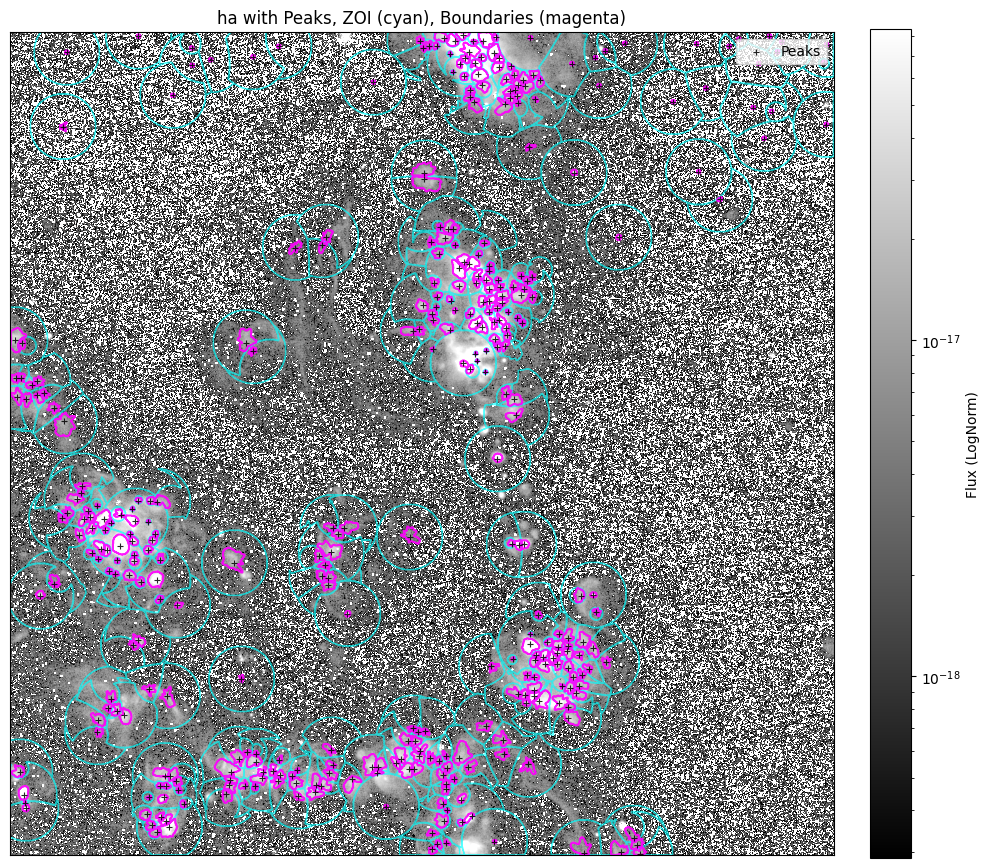

Creating overlay plot for hb with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/F6/overlays/M33_F6_hb_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/F6/overlays/M33_F6_hb_overlay.png


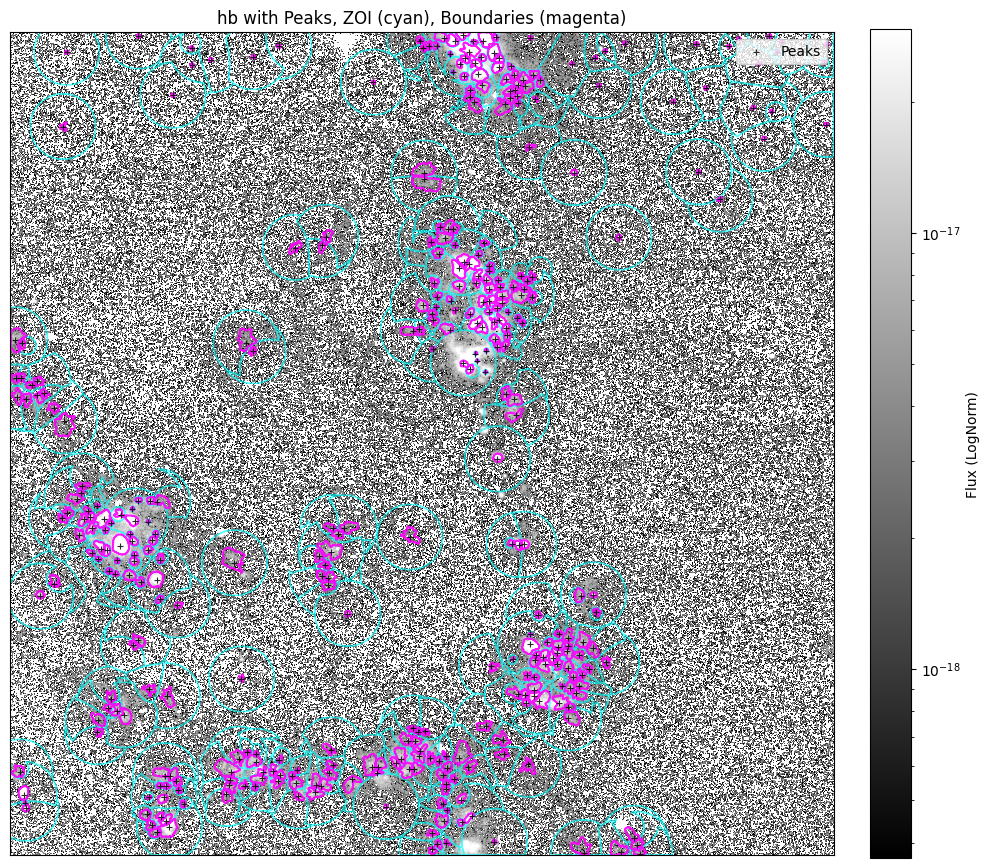

Creating overlay plot for oiii5007 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/F6/overlays/M33_F6_oiii5007_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/F6/overlays/M33_F6_oiii5007_overlay.png


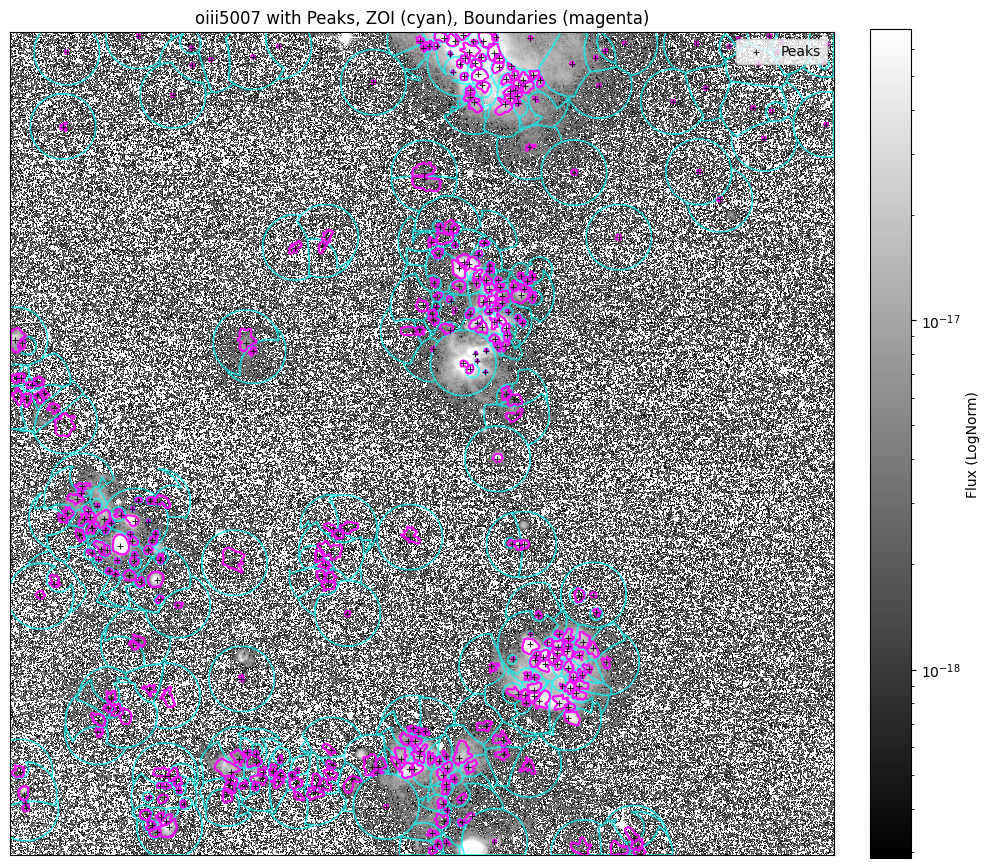

Creating overlay plot for sii6716 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/F6/overlays/M33_F6_sii6716_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/F6/overlays/M33_F6_sii6716_overlay.png


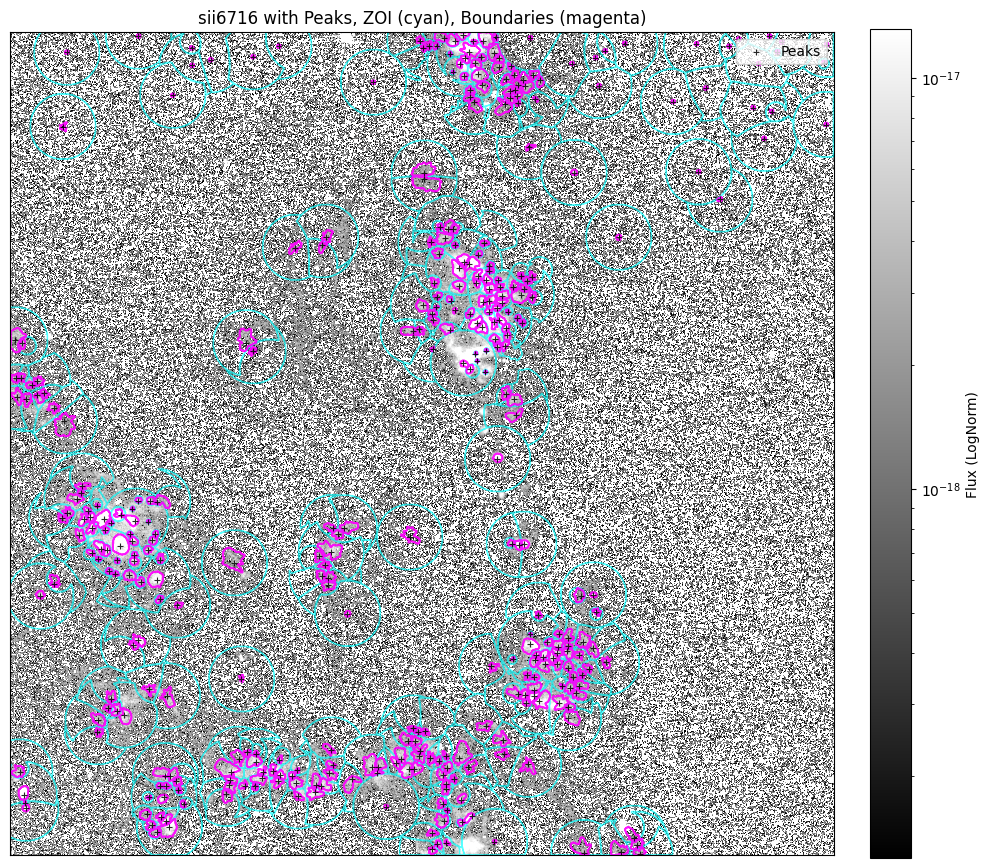

Creating overlay plot for sii6731 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/F6/overlays/M33_F6_sii6731_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/F6/overlays/M33_F6_sii6731_overlay.png


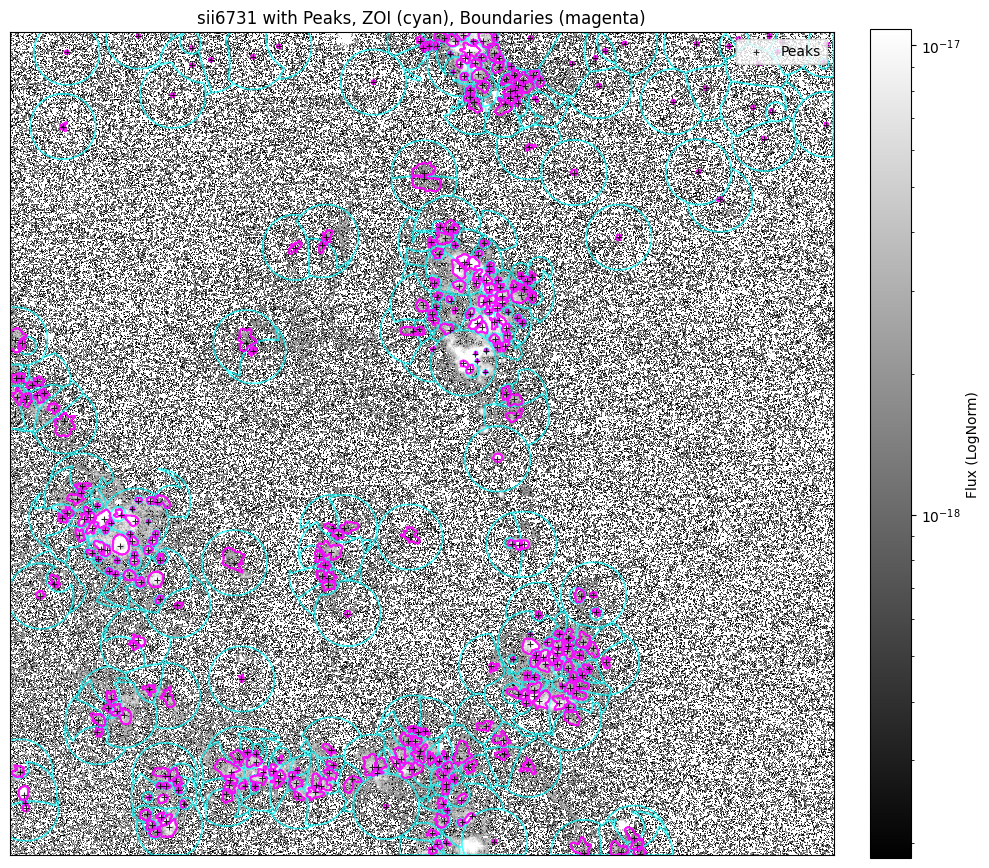

Creating overlay plot for nii6584 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/F6/overlays/M33_F6_nii6584_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/F6/overlays/M33_F6_nii6584_overlay.png


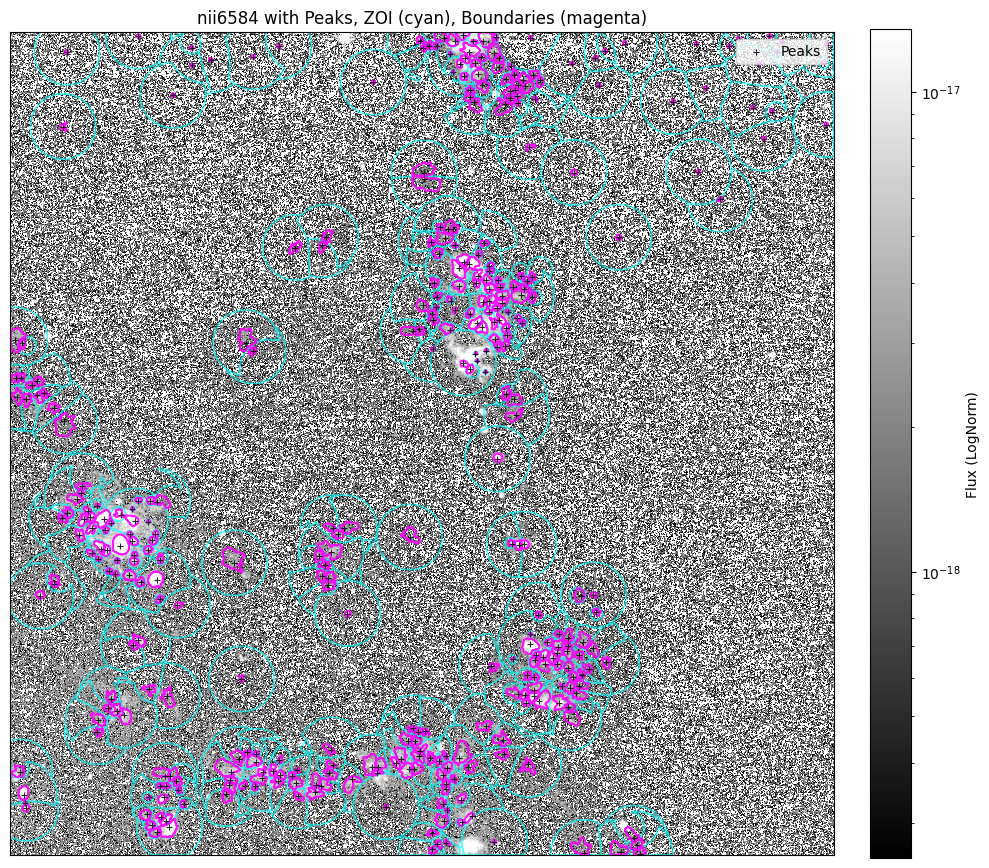

Creating overlay plot for oii3727 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/F6/overlays/M33_F6_oii3727_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/F6/overlays/M33_F6_oii3727_overlay.png


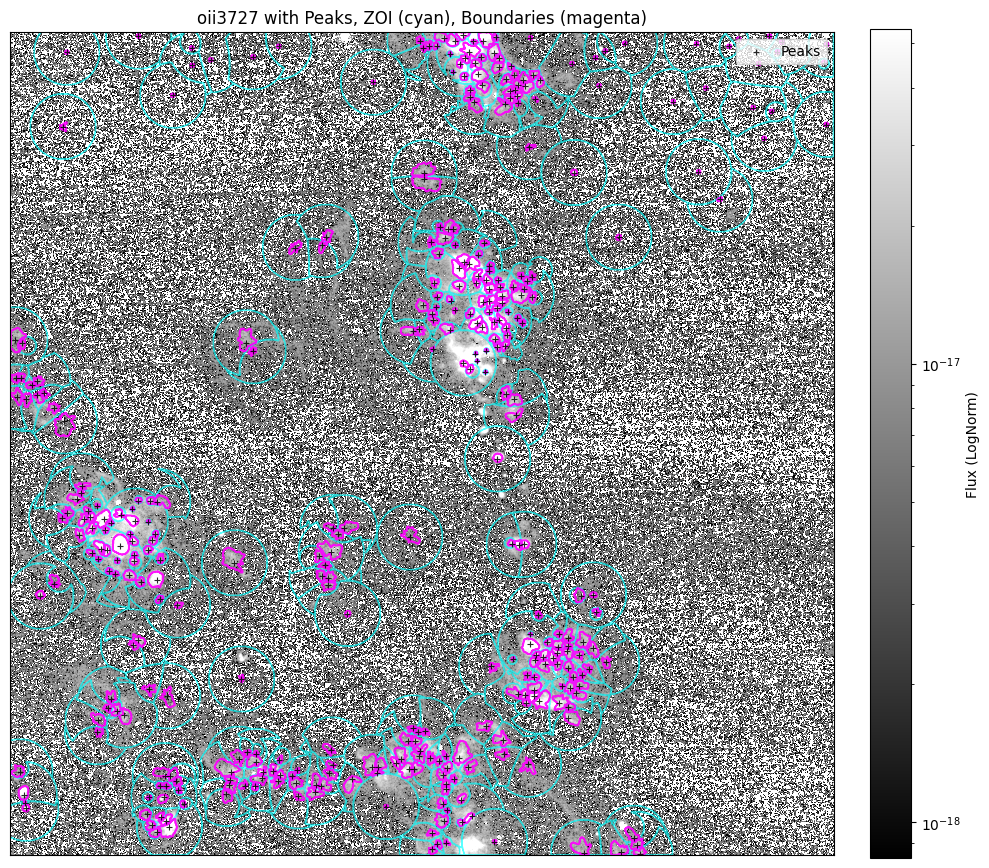

In [17]:
"""
Runs the full-field overlay plot using the variables created earlier in the notebook.
"""
# Example usage (matches your earlier variables):
# - combined: your peak catalog dataframe
# - halpha_fits: Halpha FITS path
# - zoi_label: ZOI label map (2D)
# - boundary_label: final boundary label map (2D)

# Optional: zoom limits (set to None to show full frame)
xlim = (50, 2000)
ylim = (50, 2000)

contzoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ContZoI_map_{field}.fits"
contzoi_label = fits.getdata(contzoi_fits)
cont_map_fits = f"Boundary_maps/Boundary_map_100pc/ContDomain_map_{field}.fits"
cont_map = fits.getdata(cont_map_fits)

plot_maps_dir = os.path.join(figure_dir, f"overlays")
os.makedirs(plot_maps_dir, exist_ok=True)
folder = f"../M33-Maps-Calibrated/M33-{field}/"
for line in ["ha", "hb", "oiii5007", "sii6716", "sii6731", "nii6584", "oii3727"]:
    line_fits = f"{folder}M33{field}-{line}flux.fits"
    line_data = fits.getdata(line_fits)
    line_data = np.where(np.isfinite(line_data), line_data, np.nan)
    plot_overlay_path = os.path.join(plot_maps_dir, f"M33_{field}_{line}_overlay.png")
    print(f"Creating overlay plot for {line} with peaks, ZOI, and boundaries; saving to: {plot_overlay_path}")
    plot_field_overlay_halpha_peaks_zoi_boundaries(
        catalog_df=merged_df,
        ha_fits_path=line_fits,
        zoi_label_map=contzoi_label,
        boundary_label_map=cont_map,
        field_name=f"M33 {field}",
        x_col="x",
        y_col="y",
        region_label_col="zoi_center_label",
        xlim=xlim,
        ylim=ylim,
        show_peaks=True,
        show_zoi=True,
        show_boundaries=True,
        savepath=plot_overlay_path,
        line = line
    )